In [30]:
##One can find all your predictions Json File in Inference\\Predictions\\
IMAGE_FOLDER_INFERENCE = 'C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\SOD_24\\TEST1\\Images' #Image Directory Path!!  DESKTOP\\EXTRACT\\SOD_24\\TEST1\\Images
STEP_FOLDER= 'C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\Inference\\Images' #Process Directory Path!! "Important for Iterator Load"

#Modify Line 124: model_hbbox, 125: model_kp: PATH

#Importing Libraries
import os, cv2, numpy as np, matplotlib.pyplot as plt
import shutil
from tkinter import image_types
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.transforms import functional as F
import pandas as pd
import os
import shutil

from datetime import datetime
import time
from plyer import notification
import logging
#https://github.com/pytorch/vision/tree/main/references/detection (ADD THESE DETECTION SCRIPTS IN THE SAME FOLDER ALONG WITH THIS INFERNECE SCRIPT)
import transforms, utils, engine, train
from utils import collate_fn
from engine import train_one_epoch, evaluate
from pathlib import Path

start= time.time()

#Class for creating Model Tensor Input
class ClassDataset(Dataset):
    def __init__(self, root):               
        self.root = root
        self.imgs_files = sorted(os.listdir(os.path.join(root)))
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root, self.imgs_files[idx])
        imgname=Path(img_path).stem
        img_original = cv2.imread(img_path)
        #img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)   #Comment for Grayscale NIR Images     
        img_original = F.to_tensor(img_original)
        return img_original, {}, imgname
    
    def __len__(self):
        return len(self.imgs_files)


#Function for calling te pretrained weights
def get_model_trained(num_keypoints, weights_path):
    
    anchor_generator = AnchorGenerator(sizes=(32, 64, 128, 256, 512), aspect_ratios=(0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 4.0))
    model = torchvision.models.detection.keypointrcnn_resnet50_fpn(pretrained=False,
                                                                   pretrained_backbone=True,
                                                                   num_keypoints=num_keypoints,
                                                                   num_classes = 2, # Background is the first class, object is the second class
                                                                   rpn_anchor_generator=anchor_generator)
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

    if weights_path:
        state_dict = torch.load(weights_path, map_location=torch.device("cpu"))
        model.load_state_dict(state_dict['model_state_dict'])
        optimizer.load_state_dict(state_dict['optimizer_state_dict'])        
        
    return model

#"""
#For SOD 24 Keypoints Detection - [7 Facial + 17 Body] Keypoint_Class_Labels & Bounding_Box_Labels
keypoints_classes_ids2names = {0: 'Nose', 1: 'Right_Eye', 2:'Left_Eye', 3: 'Head_Center',4: 'Lower_Neck',5:  'Right_Ear',6: 'Left_Ear', 7: 'Right_Shoulder', 8: 'Mid_Chest', 9: 'Left_Shoulder', 10: 'Right_Elbow', 11: 'Left_Elbow', 12: 'Right_Wrist', 13: 'Left_Wrist', 14: 'Right_Hand_Center', 15: 'Left_Hand_Center', 16: 'Right_Hand_LFT', 17: 'Left_Hand_LFT', 18: 'Right_Waist', 19: 'Mid_Waist', 20: 'Left_Waist', 21: 'Right_Thigh', 22: 'Left_Thigh', 23:'Chin'}
#bboxes_classes_id2names = {0: 'Body', 1: 'Head', 2: 'Face'}
#"""
#Function for visualizing the predictions
def visualize_final(image, bboxes, keypoints, keypoints_scores, parameter):
    fontsize=20
    for bbox in bboxes:
        #for bbox in enumerate(bboxs):
            start_point = (bbox[0], bbox[1])
            end_point = (bbox[2], bbox[3])
            image = cv2.rectangle(image.copy(), start_point, end_point, (0,255,0), 3)
    
    fidx=0
    idx=0
    for kps in keypoints:
        for idx, kp in enumerate(kps):
        #print(kp)
            x=keypoints_scores[fidx][idx]
            #print(tuple(kp))
            if(x>=parameter):
                #print(tuple(kp))
                image_relevant = cv2.circle(image, tuple(kp), 4, (255,0,0), 8)
                #image_relevant = cv2.putText(image, " " + keypoints_classes_ids2names[idx], tuple(kp), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200,0,0), 2, cv2.LINE_AA)
                image_relevant = cv2.putText(image, " " + str(idx), tuple(kp), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200,0,0), 2, cv2.LINE_AA)
        fidx=fidx+1   

    for kps in keypoints:
        for idx, kp in enumerate(kps):
            image = cv2.circle(image.copy(), tuple(kp), 4, (255,0,0), 8)
            image = cv2.putText(image.copy(), " " + keypoints_classes_ids2names[idx], tuple(kp), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200,0,0), 2, cv2.LINE_AA)
        
    f, ax = plt.subplots(1, 2, figsize=(40, 20))

    ax[0].imshow(image)
    ax[0].set_title('Original image with all keypoints', fontsize=fontsize)

    ax[1].imshow(image_relevant)
    ax[1].set_title('Original image with only high accuracy keypoints', fontsize=fontsize)
##########


#Specify Device 
device = torch.device('cpu')
count=0

os.chdir(IMAGE_FOLDER_INFERENCE)
for f in os.listdir():
    shutil.copy(f, STEP_FOLDER)
    dataset = ClassDataset(STEP_FOLDER)
    data_loader = DataLoader(dataset, batch_size=1, shuffle=False, collate_fn=collate_fn)
    iterator = iter(data_loader)
    images, targets, imgname = next(iterator)
    images = list(image.to(device) for image in images)
    model_hbbox = get_model_trained(num_keypoints=24, weights_path=os.environ["userprofile"] + "\\DESKTOP\\Extract\\Inference\\Model_Weights\\head_bbox_epochs-50_batch-2.pth")
    model_kp = get_model_trained(num_keypoints=24, weights_path=os.environ["userprofile"] + "\\DESKTOP\\Extract\\Inference\\Model_Weights\\keypoint_final_epochs-5+15.pth")

    with torch.no_grad():
        model_hbbox.to(device)
        model_hbbox.eval()
        output_hbbox = model_hbbox(images)

    with torch.no_grad():
        model_kp.to(device)
        model_kp.eval()
        output_kp = model_kp(images)

    image = (images[0].permute(1,2,0).detach().cpu().numpy() * 255).astype(np.uint8)
    scores = output_hbbox[0]['scores'].detach().cpu().numpy()
    high_scores_idxs = np.where(scores > 0.95)[0].tolist() # Indexes of boxes with scores > 0.85
    post_nms_idxs = torchvision.ops.nms(output_hbbox[0]['boxes'][high_scores_idxs], output_hbbox[0]['scores'][high_scores_idxs], 0.7).cpu().numpy() # Indexes of boxes left after applying NMS (iou_threshold=0.7)
    bboxes = []
    for bbox in output_hbbox[0]['boxes'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
        bboxes.append(list(map(int, bbox.tolist())))
    bboxes_scores=output_hbbox[0]['scores'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy()

    image = (images[0].permute(1,2,0).detach().cpu().numpy() * 255).astype(np.uint8)
    scores = output_kp[0]['scores'].detach().cpu().numpy()
    high_scores_idxs = np.where(scores > 0.95)[0].tolist() # Indexes of boxes with scores > 0.85
    post_nms_idxs = torchvision.ops.nms(output_kp[0]['boxes'][high_scores_idxs], output_kp[0]['scores'][high_scores_idxs], 0.7).cpu().numpy() # Indexes of boxes left after applying NMS (iou_threshold=0.7)
    keypoints = []
    for kps in output_kp[0]['keypoints'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
            keypoints.append([list(map(int, kp[:2] )) for kp in kps])
    keypoints_scores=output_kp[0]['keypoints_scores'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy() 
    parameter=np.mean(np.mean(keypoints_scores))/2 #Passed for calculating good points
    """
    print(bboxes)
    print(" ")
    print(bboxes_scores)
    print(" ")
    print(keypoints)
    print(" ")
    print(keypoints_scores)
    """
    #visualize_final(image, bboxes, keypoints, keypoints_scores, parameter)
    df=pd.DataFrame({'bboxes':[bboxes], 'bboxes_scores':[bboxes_scores], 'keypoints':[keypoints], 'keypoints_scores':[keypoints_scores], 'parameter':[parameter] })
    #print(df)
    imgname=str(imgname)
    for i in range(3):
        imgname = imgname.rstrip(imgname[-1])
    for i in range(2):
        imgname = imgname.lstrip(imgname[0])
    #print(str)
    df.to_json(os.environ["userprofile"] + "\\DESKTOP\\Extract\\Inference\\Predictions\\"+imgname+".json",orient='records', lines=True)
    for f in os.listdir(STEP_FOLDER):
       os.remove(os.path.join(STEP_FOLDER, f))
    count=count+1

end=time.time()
notification.notify(title="Report Status!!!",  message=f"Tuhh...Duhh...Image Keypoints has been successfully predicted. \nTotal Images Count: {count} in {end-start} seconds", timeout = 6000)

In [ ]:
PREDICTIONS_FOLDER='C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\Inference\\Predictions'
for f in os.listdir(PREDICTIONS_FOLDER):
    os.remove(os.path.join(PREDICTIONS_FOLDER, f))

In [7]:
import os, json
KEYPOINTS_GT_ANNOTATION_FOLDER = 'C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\SOD_24\\TEST1\\annotations'
KEYPOINTS_PREDICTED_ANNOTATION_FOLDER = 'C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\Inference\\Predictions'

count=0
p=0
TP=[]
TP=[0 for i in range(24)]
FP=[]
FP=[0 for i in range(24)]
FN=[]
FN=[0 for i in range(24)]
TN=[]
TN=[0 for i in range(24)]
TN=[]
TN=[0 for i in range(24)]

os.chdir(KEYPOINTS_GT_ANNOTATION_FOLDER)
for f in os.listdir():
    GT_annotations_path = os.path.join(KEYPOINTS_GT_ANNOTATION_FOLDER, f)
    GT_data=json.load(open(GT_annotations_path))
    keypoints_GT=GT_data['keypoints']
    
    Predicted_annotations_path = os.path.join(KEYPOINTS_PREDICTED_ANNOTATION_FOLDER, f)
    Predicted_data = json.load(open(Predicted_annotations_path))
    keypoints_scores_PT = Predicted_data['keypoints_scores']
    parameter = Predicted_data['parameter']
    
    idx=0
    jdx=0
    #print(f)
    """
    for i in range(1):
        for j in range(24):
            #print(idx, jdx)
            if(keypoints_scores_PT[idx][jdx]>parameter and keypoints_GT[idx][jdx][2]>0):
                TP[jdx]=TP[jdx]+1
            elif(keypoints_scores_PT[idx][jdx]>parameter and keypoints_GT[idx][jdx][2]<0):
                FP[jdx]=FP[jdx]+1
            elif(keypoints_scores_PT[idx][jdx]<=parameter and keypoints_GT[idx][jdx][2]>0):
                FN[jdx]=FN[jdx]+1
            jdx=jdx+1
        if(jdx==24):
            jdx=0
        idx=idx+1
    count=count+1
    """
    for i in keypoints_GT:
        for j in i:
            #print(j)
            #print(idx, jdx)
            if(keypoints_scores_PT[idx][jdx]>parameter and j[2]>0):
                TP[jdx]=TP[jdx]+1
            elif(keypoints_scores_PT[idx][jdx]>parameter and j[2]==0):
                FP[jdx]=FP[jdx]+1
            elif(keypoints_scores_PT[idx][jdx]<=parameter and j[2]>0):
                FN[jdx]=FN[jdx]+1
            elif(keypoints_scores_PT[idx][jdx]<=parameter and j[2]==0):
                TN[jdx]=TN[jdx]+1
            jdx=jdx+1
            if(jdx==24):
                jdx=0
        idx=idx+1
    
    p=idx+p
    count=count+1
    #print(count)
    

print(p)  
print(TP)
print(FP)
print(FN)
print(TN)
print(count)      

314
[305, 310, 254, 314, 314, 286, 81, 313, 312, 311, 291, 21, 0, 0, 248, 17, 0, 0, 189, 295, 281, 303, 309, 0]
[2, 4, 59, 0, 0, 28, 233, 1, 0, 3, 0, 197, 280, 94, 1, 55, 0, 0, 0, 0, 0, 0, 5, 312]
[3, 0, 0, 0, 0, 0, 0, 0, 2, 0, 23, 8, 0, 0, 55, 76, 0, 0, 125, 19, 33, 11, 0, 0]
[4, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 88, 34, 220, 10, 166, 314, 314, 0, 0, 0, 0, 0, 2]
314


In [4]:
import os, json
KEYPOINTS_GT_ANNOTATION_FOLDER = 'C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\SOD_24\\DATA2\\annotations'
KEYPOINTS_PREDICTED_ANNOTATION_FOLDER = 'C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\Inference\\Predictions'

count=0
p=0

LV=[]
LV=[0 for i in range(24)]
NV=[]
NV=[0 for i in range(24)]
NL=[]
NL=[0 for i in range(24)]


os.chdir(KEYPOINTS_GT_ANNOTATION_FOLDER)
for f in os.listdir():
    GT_annotations_path = os.path.join(KEYPOINTS_GT_ANNOTATION_FOLDER, f)
    GT_data=json.load(open(GT_annotations_path))
    keypoints_GT=GT_data['keypoints']
    idx=0
    for kps in keypoints_GT:
        j=0
        for kp in kps:
            if(kp[2]==2):
                LV[j]=LV[j]+1
            if(kp[2]==1):
                NV[j]=NV[j]+1
            elif(kp[2]==0):
                NL[j]=NL[j]+1
            j=j+1
        idx=idx+1
    p=idx+p
    count=count+1
    #print(count)
    

print(p)  
print(LV)
print(NV)
print(NL)
print(count)      

5650
[0, 3188, 3454, 5475, 3206, 2273, 2254, 4677, 3864, 4658, 4239, 2824, 4006, 2814, 3417, 2872, 0, 0, 3266, 4523, 2421, 3500, 4528, 16]
[5286, 1164, 1225, 40, 2258, 898, 770, 213, 1674, 246, 284, 624, 453, 416, 566, 367, 0, 0, 2026, 972, 2968, 719, 476, 5272]
[364, 1298, 971, 135, 186, 2479, 2626, 760, 112, 746, 1127, 2202, 1191, 2420, 1667, 2411, 5650, 5650, 358, 155, 261, 1431, 646, 362]
3889


In [32]:
from tqdm import tqdm_notebook as tqdm

C:\Users\JHAANIK\AppData\Local\Temp\ipykernel_10024\3627320272.py:107: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(1, 2, figsize=(40, 20))


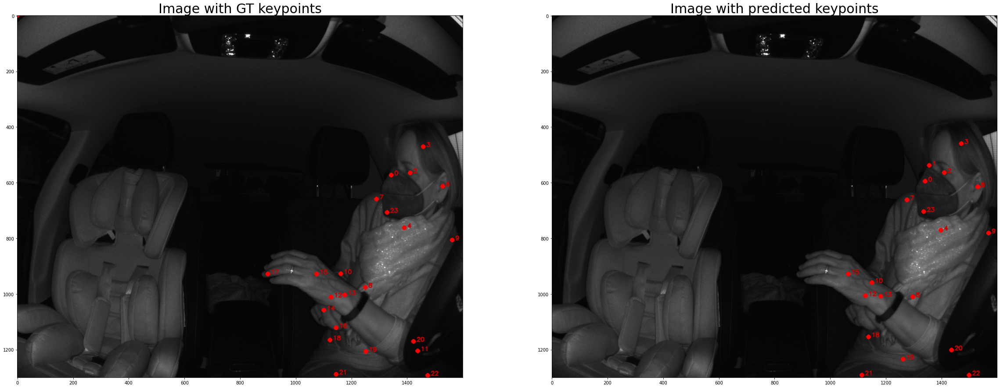

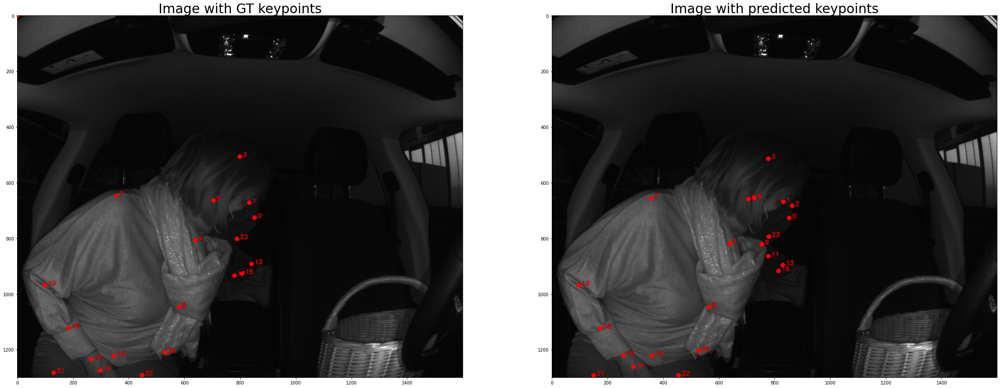

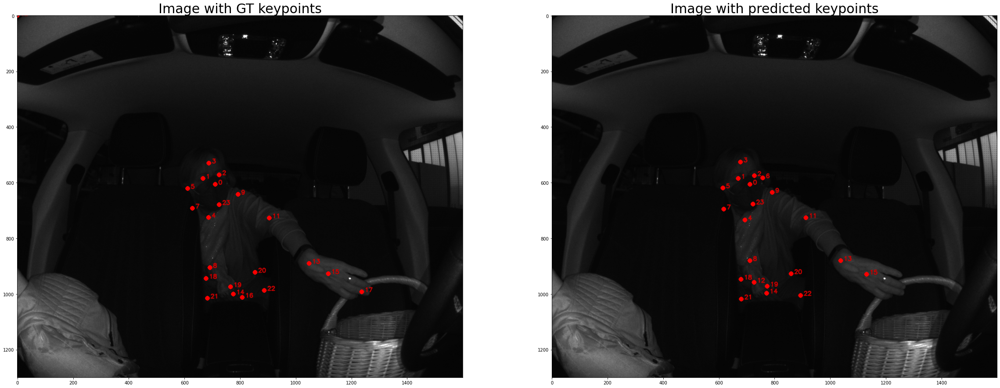

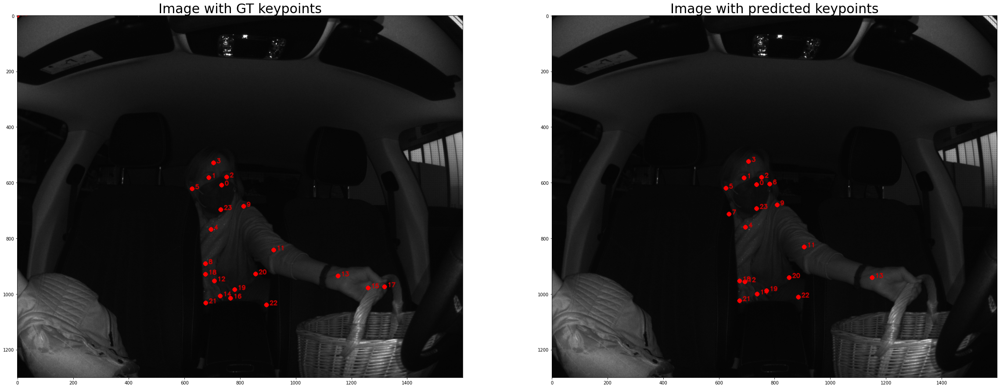

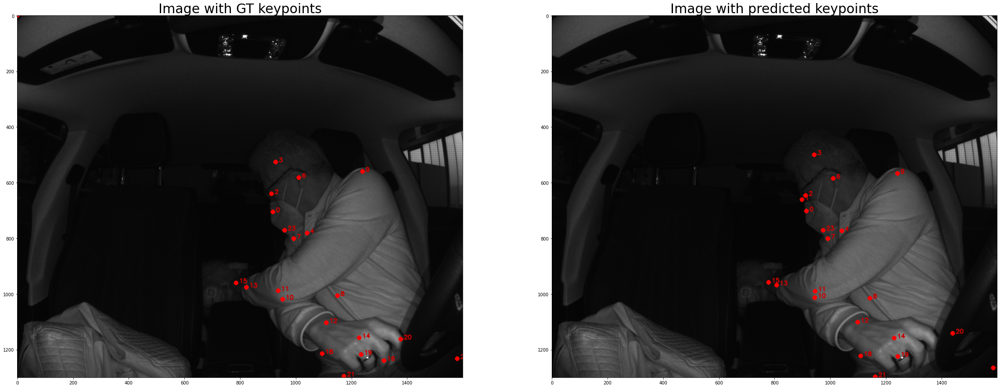

...

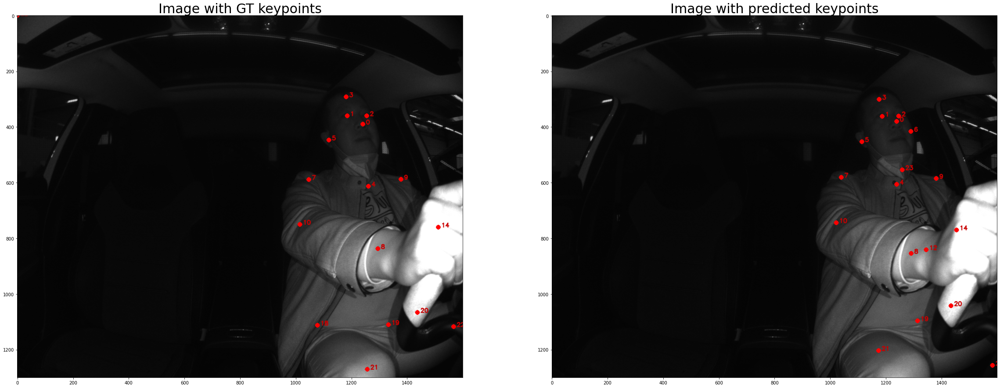

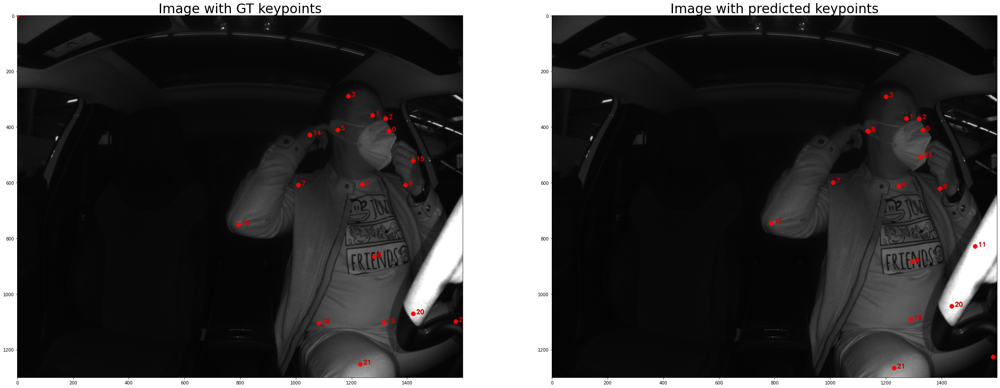

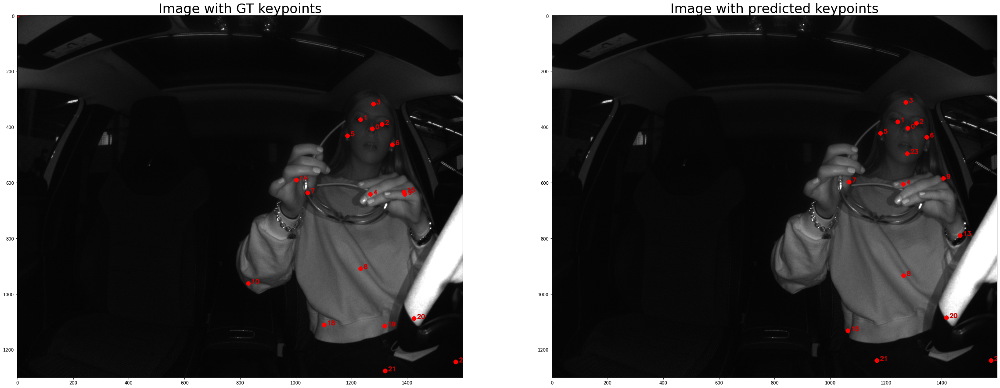

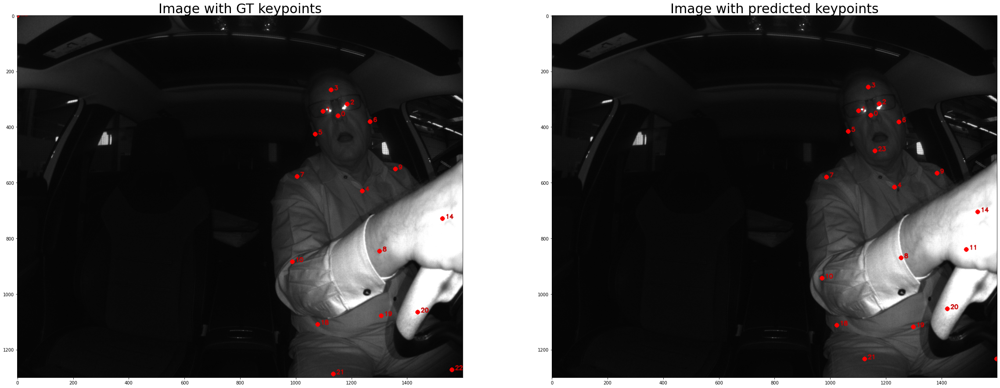

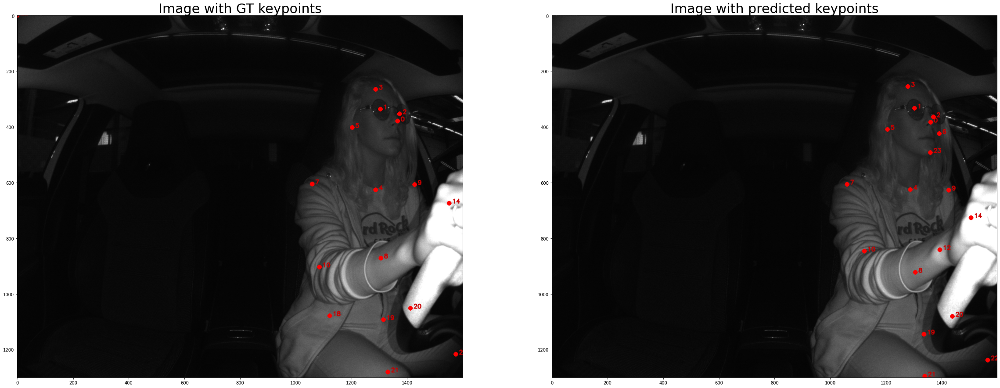

In [36]:

##One can find all your predictions Json File in Inference\\Predictions\\IMAGE_FOLDER_INFERENCE = 'C:\\Users\\JHAANIK\\Documents\\Images' #Image Directory Path!!  DESKTOP\\EXTRACT\\SOD_24\\TEST1\\Images
STEP_FOLDER= 'C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\Inference\\Images' #Process Directory Path!! "Important for Iterator Load"
KEYPOINTS_GT_ANNOTATION_FOLDER = 'C:\\Users\\JHAANIK\\DESKTOP\\EXTRACT\\SOD\\annotations'

#Modify Line 124: model_hbbox, 125: model_kp: PATH

#Importing Libraries
import os, cv2, numpy as np, matplotlib.pyplot as plt
import shutil
from tkinter import image_types
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.transforms import functional as F
import pandas as pd
import os
import shutil

from datetime import datetime
import time
from plyer import notification
import logging
#https://github.com/pytorch/vision/tree/main/references/detection (ADD THESE DETECTION SCRIPTS IN THE SAME FOLDER ALONG WITH THIS INFERNECE SCRIPT)
import transforms, utils, engine, train
from utils import collate_fn
from engine import train_one_epoch, evaluate
from pathlib import Path

start= time.time()

#Class for creating Model Tensor Input
class ClassDataset(Dataset):
    def __init__(self, root):               
        self.root = root
        self.imgs_files = sorted(os.listdir(os.path.join(root)))
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root, self.imgs_files[idx])
        imgname=Path(img_path).stem
        img_original = cv2.imread(img_path)
        #img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)   #Comment for Grayscale NIR Images     
        img_original = F.to_tensor(img_original)
        return img_original, {}, imgname
    
    def __len__(self):
        return len(self.imgs_files)


#Function for calling te pretrained weights
def get_model_trained(num_keypoints, weights_path):
    
    anchor_generator = AnchorGenerator(sizes=(32, 64, 128, 256, 512), aspect_ratios=(0.25, 0.5, 0.75, 1.0, 2.0, 3.0, 4.0))
    model = torchvision.models.detection.keypointrcnn_resnet50_fpn(pretrained=False,
                                                                   pretrained_backbone=True,
                                                                   num_keypoints=num_keypoints,
                                                                   num_classes = 2, # Background is the first class, object is the second class
                                                                   rpn_anchor_generator=anchor_generator)
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

    if weights_path:
        state_dict = torch.load(weights_path, map_location=torch.device("cpu"))
        model.load_state_dict(state_dict['model_state_dict'])
        optimizer.load_state_dict(state_dict['optimizer_state_dict'])        
        
    return model

#"""
#For SOD 24 Keypoints Detection - [7 Facial + 17 Body] Keypoint_Class_Labels & Bounding_Box_Labels
keypoints_classes_ids2names = {0: 'Nose', 1: 'Right_Eye', 2:'Left_Eye', 3: 'Head_Center',4: 'Lower_Neck',5:  'Right_Ear',6: 'Left_Ear', 7: 'Right_Shoulder', 8: 'Mid_Chest', 9: 'Left_Shoulder', 10: 'Right_Elbow', 11: 'Left_Elbow', 12: 'Right_Wrist', 13: 'Left_Wrist', 14: 'Right_Hand_Center', 15: 'Left_Hand_Center', 16: 'Right_Hand_LFT', 17: 'Left_Hand_LFT', 18: 'Right_Waist', 19: 'Mid_Waist', 20: 'Left_Waist', 21: 'Right_Thigh', 22: 'Left_Thigh', 23:'Chin'}
#bboxes_classes_id2names = {0: 'Body', 1: 'Head', 2: 'Face'}
#"""
#Function for visualizing the predictions
def visualize_final(image, bboxes, keypoints, keypoints_scores, parameter, keypoints_GT, bboxes_GT):
    fontsize=30
    img_GT=image.copy()
    """
    for bbox in bboxes_GT:
        #for bbox in enumerate(bboxs):
            start_point = (bbox[0], bbox[1])
            end_point = (bbox[2], bbox[3])
            image = cv2.rectangle(image.copy(), start_point, end_point, (0,255,0), 3)
            img_GT= cv2.rectangle(img_GT.copy(), start_point, end_point, (0,255,0), 3)
    """
    image=image.copy()
    fidx=0
    idx=0
    for kps in keypoints:
        for idx, kp in enumerate(kps):
        #print(kp)
            x=keypoints_scores[fidx][idx]
            #print(tuple(kp))
            if(x>=parameter):
                #print(tuple(kp))
                image_relevant = cv2.circle(image, tuple(kp), 4, (255,0,0), 8)
                #image_relevant = cv2.putText(image, " " + keypoints_classes_ids2names[idx], tuple(kp), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200,0,0), 2, cv2.LINE_AA)
                image_relevant = cv2.putText(image, " " + str(idx), tuple(kp), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200,0,0), 2, cv2.LINE_AA)
        fidx=fidx+1   

    for kps in keypoints_GT:
        for idx, kp in enumerate(kps):
            #print(tuple(kp))
            image_GT = cv2.circle(img_GT, tuple(kp), 4, (255,0,0), 8)
            image_GT = cv2.putText(img_GT, " " + str(idx), tuple(kp), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (200,0,0), 2, cv2.LINE_AA)
        
    f, ax = plt.subplots(1, 2, figsize=(40, 20))

    ax[0].imshow(image_GT)
    ax[0].set_title('Image with GT keypoints', fontsize=fontsize)

    ax[1].imshow(image_relevant)
    ax[1].set_title('Image with predicted keypoints', fontsize=fontsize)
##########


#Specify Device 
device = torch.device('cpu')
count=0

os.chdir(IMAGE_FOLDER_INFERENCE)
for f in os.listdir():
    shutil.copy(f, STEP_FOLDER)
    dataset = ClassDataset(STEP_FOLDER)
    data_loader = DataLoader(dataset, batch_size=1, shuffle=False, collate_fn=collate_fn)
    iterator = iter(data_loader)
    images, targets, imgname = next(iterator)
    images = list(image.to(device) for image in images)
    model_hbbox = get_model_trained(num_keypoints=24, weights_path=os.environ["userprofile"] + "\\DESKTOP\\Extract\\Inference\\Model_Weights\\head_bbox_epochs-50_batch-2.pth")
    model_kp = get_model_trained(num_keypoints=24, weights_path=os.environ["userprofile"] + "\\DESKTOP\\Extract\\Inference\\Model_Weights\\keypoint_final_epochs-5+15.pth")

    with torch.no_grad():
        model_hbbox.to(device)
        model_hbbox.eval()
        output_hbbox = model_hbbox(images)

    with torch.no_grad():
        model_kp.to(device)
        model_kp.eval()
        output_kp = model_kp(images)

    image = (images[0].permute(1,2,0).detach().cpu().numpy() * 255).astype(np.uint8)
    scores = output_hbbox[0]['scores'].detach().cpu().numpy()
    high_scores_idxs = np.where(scores > 0.95)[0].tolist() # Indexes of boxes with scores > 0.85
    post_nms_idxs = torchvision.ops.nms(output_hbbox[0]['boxes'][high_scores_idxs], output_hbbox[0]['scores'][high_scores_idxs], 0.7).cpu().numpy() # Indexes of boxes left after applying NMS (iou_threshold=0.7)
    bboxes = []
    for bbox in output_hbbox[0]['boxes'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
        bboxes.append(list(map(int, bbox.tolist())))
    bboxes_scores=output_hbbox[0]['scores'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy()

    image = (images[0].permute(1,2,0).detach().cpu().numpy() * 255).astype(np.uint8)
    scores = output_kp[0]['scores'].detach().cpu().numpy()
    high_scores_idxs = np.where(scores > 0.95)[0].tolist() # Indexes of boxes with scores > 0.85
    post_nms_idxs = torchvision.ops.nms(output_kp[0]['boxes'][high_scores_idxs], output_kp[0]['scores'][high_scores_idxs], 0.7).cpu().numpy() # Indexes of boxes left after applying NMS (iou_threshold=0.7)
    keypoints = []
    for kps in output_kp[0]['keypoints'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy():
            keypoints.append([list(map(int, kp[:2] )) for kp in kps])
    keypoints_scores=output_kp[0]['keypoints_scores'][high_scores_idxs][post_nms_idxs].detach().cpu().numpy() 
    parameter=np.mean(np.mean(keypoints_scores))/2 #Passed for calculating good points
    
    
    """
    print(bboxes)
    print(" ")
    print(bboxes_scores)
    print(" ")
    print(keypoints)
    print(" ")
    print(keypoints_scores)
    """
   
    df=pd.DataFrame({'bboxes':[bboxes], 'bboxes_scores':[bboxes_scores], 'keypoints':[keypoints], 'keypoints_scores':[keypoints_scores], 'parameter':[parameter] })
    #print(df)
    imgname=str(imgname)
    for i in range(3):
        imgname = imgname.rstrip(imgname[-1])
    for i in range(2):
        imgname = imgname.lstrip(imgname[0])
    #print(str)
    
    GT_annotations_path = os.path.join(KEYPOINTS_GT_ANNOTATION_FOLDER, imgname+".json")
    GT_data=json.load(open(GT_annotations_path))
    keypoints_GT3=GT_data['keypoints']
    keypoints_GT=[]
    for kps in keypoints_GT3:
        keypoints_GT.append([kp[:2] for kp in kps])
    data1 = np.array(keypoints_GT)
    keypoints_GT = data1.astype(int)
    bboxes_GT=GT_data['bboxes']
    data2 = np.array(bboxes_GT)
    bboxes_GT = data2.astype(int)
    
    """
    print(bboxes_GT)
    print(" ")
    print(keypoints_GT)
    """
    
    visualize_final(image, bboxes, keypoints, keypoints_scores, parameter, keypoints_GT, bboxes_GT)
    df.to_json(os.environ["userprofile"] + "\\DESKTOP\\Extract\\Inference\\Predictions\\"+imgname+".json",orient='records', lines=True)
    for f in os.listdir(STEP_FOLDER):
       os.remove(os.path.join(STEP_FOLDER, f))
    count=count+1

end=time.time()
notification.notify(title="Report Status!!!",  message=f"Tuhh...Duhh...Image Keypoints has been successfully predicted. \nTotal Images Count: {count} in {end-start} seconds", timeout = 6000)